In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import descartes
from shapely.geometry import Point , Polygon

In [2]:
pwd

'/Users/bahar/Desktop/galvanize_Course/San_Francisco_crime_EDA'

In [3]:
ls

Cap1_map_test.ipynb  cap1_draft.ipynb     images/
README.md            data/                src/


In [4]:
cd data

/Users/bahar/Desktop/galvanize_Course/San_Francisco_crime_EDA/data


In [5]:
ls

Land_Use/             incident_reports.csv


In [6]:
cd ..

/Users/bahar/Desktop/galvanize_Course/San_Francisco_crime_EDA


In [7]:
police_df = pd.read_csv('data/incident_reports.csv')

In [11]:
police_df.head(2)

,Incident Datetime,Incident Date,Incident Time,Incident Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Incident Description,Resolution,Intersection,CNN,Police District,Analysis Neighborhood,Supervisor District,Latitude,Longitude,point
0,2018/01/01 09:26:00 AM,2018/01/01,09:26,2018,Monday,2018/01/01 09:27:00 AM,61893007041,618930,171052174,173641140.0,...,"Vehicle, Recovered, Auto",Open or Active,03RD ST \ HOLLISTER AVE,20471000.0,Southern,Bayview Hunters Point,10.0,37.721716,-122.395944,"(37.72171587946975, -122.39594382884452)"
1,2018/01/01 02:30:00 AM,2018/01/01,02:30,2018,Monday,2018/01/01 08:21:00 AM,61893105041,618931,180000768,180010668.0,...,"Burglary, Residence, Forcible Entry",Open or Active,LISBON ST \ PERSIA AVE,21719000.0,Ingleside,Excelsior,11.0,37.722000,-122.433606,"(37.722000219874225, -122.43360633930074)"


In [9]:
df_20= police_df[police_df['Incident Year'] ==2020]

In [12]:
crs= {'init': 'epsg:4326'}

In [13]:
geometry = [Point(xy) for xy in zip (df_20['Longitude'], df_20['Latitude'])]


In [14]:
geometry[:3]

In [15]:
geo_df= gpd.GeoDataFrame(df_20, crs= crs , geometry = geometry)

/Users/bahar/opt/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [16]:
geo_df.head()

,Incident Datetime,Incident Date,Incident Time,Incident Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Resolution,Intersection,CNN,Police District,Analysis Neighborhood,Supervisor District,Latitude,Longitude,point,geometry
648,2020/10/20 11:50:00 PM,2020/10/20,23:50,2020,Tuesday,2020/10/21 12:52:00 AM,97124504134,971245,200634251,202950079.0,...,Open or Active,HOUSTON ST \ COLUMBUS AVE,25526000.0,Central,Russian Hill,3.0,37.803937,-122.415446,"(37.8039365072563, -122.415445868814)",POINT (-122.41545 37.80394)
1469,2020/10/07 08:00:00 PM,2020/10/07,20:00,2020,Wednesday,2020/10/08 01:56:00 PM,97126971000,971269,206147109,NaN,...,Open or Active,NaN,NaN,Out of SF,NaN,NaN,NaN,NaN,NaN,POINT (nan nan)
1568,2020/09/26 04:30:00 PM,2020/09/26,16:30,2020,Saturday,2020/10/18 03:58:00 AM,97127571000,971275,206147121,NaN,...,Open or Active,NaN,NaN,Northern,NaN,NaN,NaN,NaN,NaN,POINT (nan nan)
2316,2020/10/21 08:33:00 AM,2020/10/21,08:33,2020,Wednesday,2020/10/21 08:34:00 AM,97131007041,971310,200609884,NaN,...,Open or Active,NaN,NaN,Out of SF,NaN,NaN,NaN,NaN,NaN,POINT (nan nan)
3593,2020/01/07 04:00:00 AM,2020/01/07,04:00,2020,Tuesday,2020/02/06 09:41:00 AM,90012406372,900124,206027460,NaN,...,Open or Active,NaN,NaN,Out of SF,NaN,NaN,NaN,NaN,NaN,POINT (nan nan)


In [19]:
street_map = gpd.read_file('data/Land_Use/geo_export_416e71ec-8222-4017-a289-fc1c76459147.shp')

In [56]:
new = geo_df[geo_df['Incident Date']=='2020/05/29'].groupby('Incident Category').count().sort_values(by ="Row ID" , ascending = False)

In [57]:
new

,Incident Datetime,Incident Date,Incident Time,Incident Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Resolution,Intersection,CNN,Police District,Analysis Neighborhood,Supervisor District,Latitude,Longitude,point,geometry
Incident Category,,,,,,,,,,,,,,,,,,,,,
Larceny Theft,65,65,65,65,65,65,65,65,65,29,...,65,63,63,65,63,63,63,63,63,65
Burglary,41,41,41,41,41,41,41,41,41,41,...,41,41,41,41,41,41,41,41,41,41
Malicious Mischief,25,25,25,25,25,25,25,25,25,23,...,25,25,25,25,25,25,25,25,25,25
Motor Vehicle Theft,23,23,23,23,23,23,23,23,23,23,...,23,23,23,23,23,23,23,23,23,23
Non-Criminal,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20
Other Miscellaneous,19,19,19,19,19,19,19,19,19,19,...,19,19,19,19,19,19,19,19,19,19
Assault,19,19,19,19,19,19,19,19,19,19,...,19,19,19,19,19,19,19,19,19,19
Recovered Vehicle,13,13,13,13,13,13,13,13,13,10,...,13,10,10,13,10,10,10,10,10,13
Fraud,11,11,11,11,11,11,11,11,11,10,...,11,11,11,11,11,11,11,11,11,11


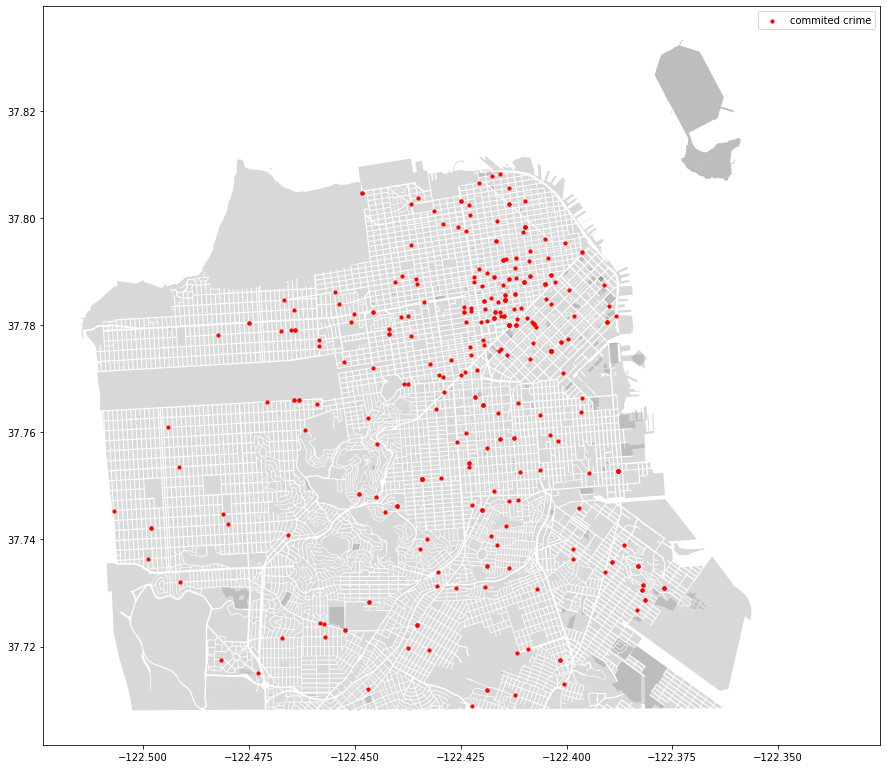

In [20]:
fig , ax = plt.subplots(figsize = (15 , 15))
street_map.plot(ax=ax , alpha = 0.3 , color = 'grey')
geo_df[geo_df['Incident Date']=='2020/05/28'].plot(ax=ax , markersize= 10 , color = 'red', marker = 'o', legend = True, label= 'commited crime')
plt.legend();

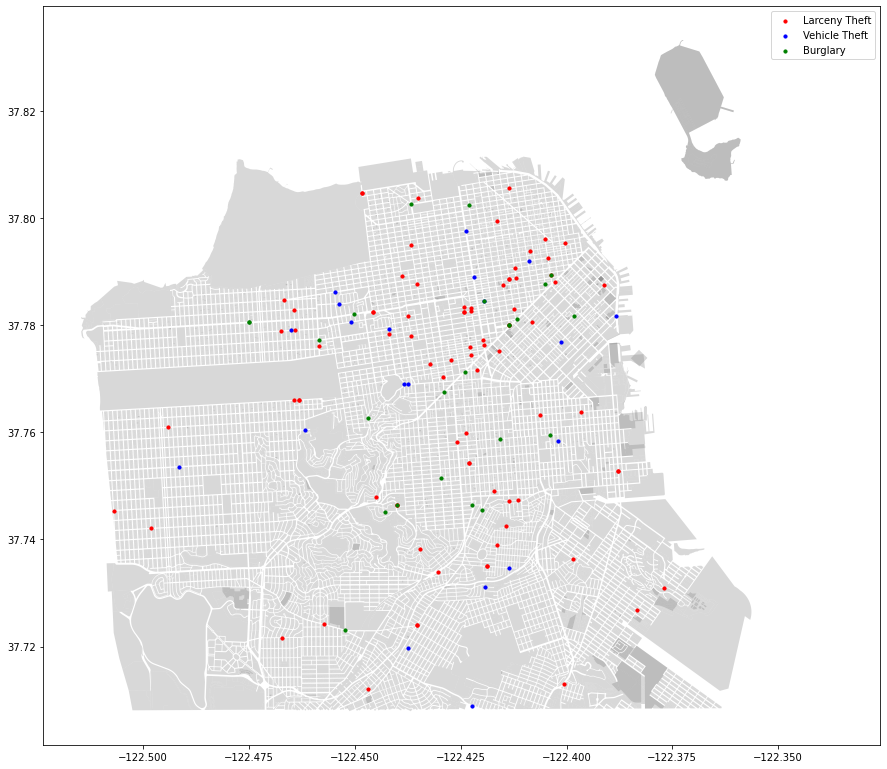

In [58]:
fig , ax = plt.subplots(figsize = (15 , 15))
street_map.plot(ax=ax , alpha = 0.3 , color = 'grey')
geo_df[(geo_df['Incident Date']=='2020/05/28') &( geo_df['Incident Category']=='Larceny Theft')].plot(ax=ax , markersize= 10 , color = 'red', marker = 'o', legend = True, label= 'Larceny Theft')
geo_df[(geo_df['Incident Date']=='2020/05/28') &( geo_df['Incident Category']=='Motor Vehicle Theft')].plot(ax=ax , markersize= 10 , color = 'b', marker = 'o', legend = True, label= 'Vehicle Theft')
geo_df[(geo_df['Incident Date']=='2020/05/28') &( geo_df['Incident Category']=='Burglary')].plot(ax=ax , markersize= 10 , color = 'g', marker = 'o', legend = True, label= 'Burglary')

plt.legend();

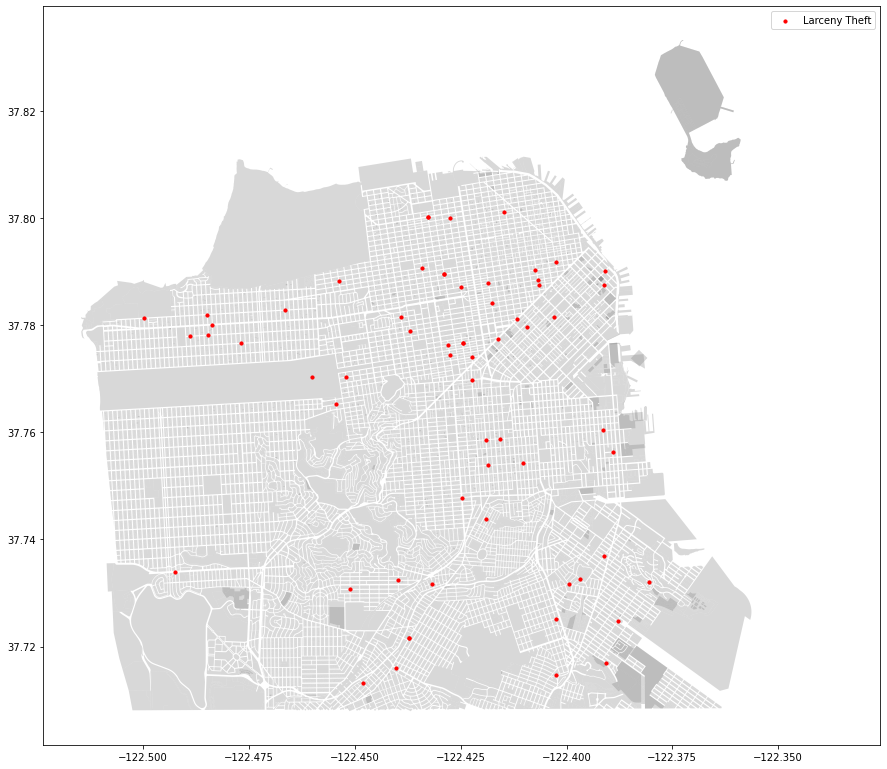

In [55]:
fig , ax = plt.subplots(figsize = (15 , 15))
street_map.plot(ax=ax , alpha = 0.3 , color = 'grey')
geo_df[(geo_df['Incident Date']=='2020/05/29') &( geo_df['Incident Category']=='Larceny Theft')].plot(ax=ax , markersize= 10 , color = 'red', marker = 'o', legend = True, label= 'Larceny Theft')
#geo_df_0[(geo_df_0['Incident Date']=='2020/05/29') &( geo_df_0['Incident Category']=='Motor Vehicle Theft')].plot(ax=ax , markersize= 10 , color = 'b', marker = 'o', legend = True, label= 'Vehicle Theft')
#geo_df_0[(geo_df_0['Incident Date']=='2020/05/29') &( geo_df_0['Incident Category']=='Arson')].plot(ax=ax , markersize= 10 , color = 'g', marker = 'o', legend = True, label= 'Arson')
plt.legend();

In [59]:
geo_df['Incident Date'] = pd.to_datetime(geo_df['Incident Date'])

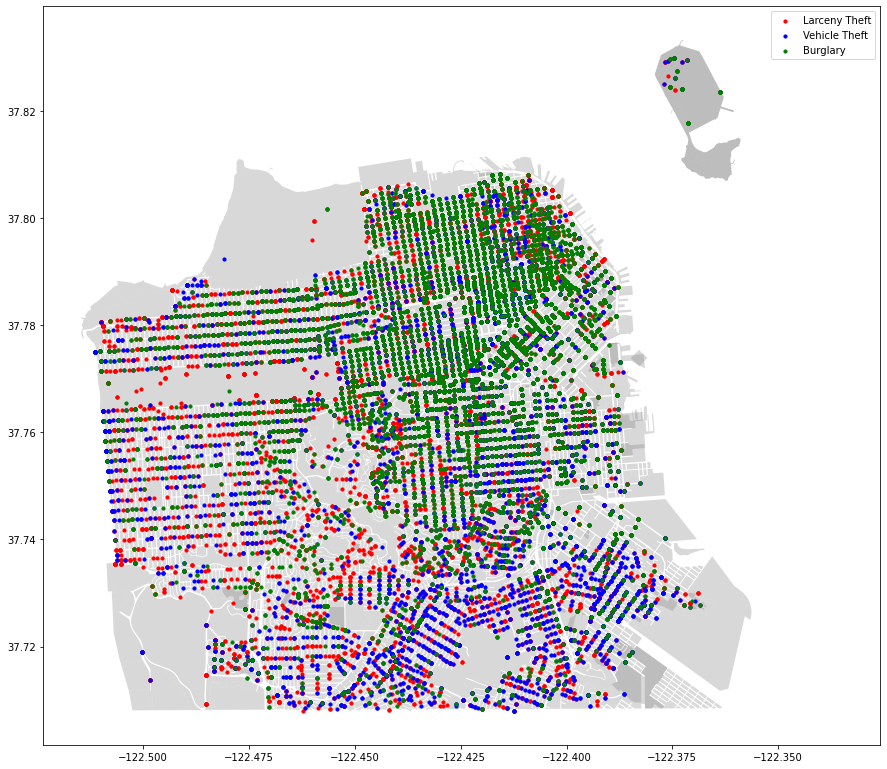

In [60]:
fig , ax = plt.subplots(figsize = (15 , 15))
street_map.plot(ax=ax , alpha = 0.3 , color = 'grey')
geo_df[(geo_df['Incident Date'].dt.year==2020)&(geo_df['Incident Date'].dt.month>2) &( geo_df['Incident Category']=='Larceny Theft')].plot(ax=ax , markersize= 10 , color = 'red', marker = 'o', legend = True, label= 'Larceny Theft')
geo_df[(geo_df['Incident Date'].dt.year==2020)&(geo_df['Incident Date'].dt.month >2) &( geo_df['Incident Category']=='Motor Vehicle Theft')].plot(ax=ax , markersize= 10 , color = 'b', marker = 'o', legend = True, label= 'Vehicle Theft')
geo_df[(geo_df['Incident Date'].dt.year==2020)&(geo_df['Incident Date'].dt.month >2) &( geo_df['Incident Category']=='Burglary')].plot(ax=ax , markersize= 10 , color = 'g', marker = 'o', legend = True, label= 'Burglary')

plt.legend();

In [23]:
import folium
from folium import plugins
import json

In [53]:
geo_df_0= geo_df.fillna(0)

In [27]:
geo_df_0


,Incident Datetime,Incident Date,Incident Time,Incident Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Resolution,Intersection,CNN,Police District,Analysis Neighborhood,Supervisor District,Latitude,Longitude,point,geometry
648,2020/10/20 11:50:00 PM,2020/10/20,23:50,2020,Tuesday,2020/10/21 12:52:00 AM,97124504134,971245,200634251,202950079.0,...,Open or Active,HOUSTON ST \ COLUMBUS AVE,25526000.0,Central,Russian Hill,3.0,37.803937,-122.415446,"(37.8039365072563, -122.415445868814)",POINT (-122.41545 37.80394)
1469,2020/10/07 08:00:00 PM,2020/10/07,20:00,2020,Wednesday,2020/10/08 01:56:00 PM,97126971000,971269,206147109,0.0,...,Open or Active,0,0.0,Out of SF,0,0.0,0.000000,0.000000,0,POINT (nan nan)
1568,2020/09/26 04:30:00 PM,2020/09/26,16:30,2020,Saturday,2020/10/18 03:58:00 AM,97127571000,971275,206147121,0.0,...,Open or Active,0,0.0,Northern,0,0.0,0.000000,0.000000,0,POINT (nan nan)
2316,2020/10/21 08:33:00 AM,2020/10/21,08:33,2020,Wednesday,2020/10/21 08:34:00 AM,97131007041,971310,200609884,0.0,...,Open or Active,0,0.0,Out of SF,0,0.0,0.000000,0.000000,0,POINT (nan nan)
3593,2020/01/07 04:00:00 AM,2020/01/07,04:00,2020,Tuesday,2020/02/06 09:41:00 AM,90012406372,900124,206027460,0.0,...,Open or Active,0,0.0,Out of SF,0,0.0,0.000000,0.000000,0,POINT (nan nan)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446530,2020/11/24 09:41:00 PM,2020/11/24,21:41,2020,Tuesday,2020/11/24 09:41:00 PM,101580815161,1015808,200711285,203293082.0,...,Exceptional Adult,FILLMORE ST \ TURK ST,25973000.0,Northern,Western Addition,5.0,37.780496,-122.432140,"(37.78049625961115, -122.43214039079034)",POINT (-122.43214 37.78050)
446536,2020/12/01 10:00:00 AM,2020/12/01,10:00,2020,Tuesday,2021/03/24 10:15:00 AM,101576271000,1015762,210183737,210831017.0,...,Open or Active,GEARY ST \ POLK ST,25182000.0,Northern,Tenderloin,6.0,37.785893,-122.419739,"(37.78589290013101, -122.41973873477666)",POINT (-122.41974 37.78589)
446548,2020/06/11 07:30:00 PM,2020/06/11,19:30,2020,Thursday,2020/06/14 05:02:00 PM,101581815200,1015818,200359857,201661909.0,...,Exceptional Adult,LAGUNA ST \ GOLDEN GATE AVE,25959000.0,Northern,Western Addition,5.0,37.780193,-122.427017,"(37.780193029586776, -122.42701675772301)",POINT (-122.42702 37.78019)
446590,2020/11/24 09:41:00 PM,2020/11/24,21:41,2020,Tuesday,2020/11/24 09:41:00 PM,101580815200,1015808,200711285,203293082.0,...,Exceptional Adult,FILLMORE ST \ TURK ST,25973000.0,Northern,Western Addition,5.0,37.780496,-122.432140,"(37.78049625961115, -122.43214039079034)",POINT (-122.43214 37.78050)


In [28]:
SF_coords = (37.733795, -122.446747)
SFmap = folium.Map(location = SF_coords, zoom_start=12, tiles='Cartodb Positron')
SFmap.add_child(plugins.HeatMap(data=geo_df_0[['Latitude','Longitude']].values, radius=4, blur=2))
SFmap.save('images/heat_map.html')                                         
SFmap

In [29]:
property_crime= df_20[['Incident ID', 'Analysis Neighborhood', 'geometry']].reset_index(drop= True)

In [30]:
property_crime.dropna(inplace= True)

In [31]:
property_crime=property_crime.reset_index(drop = True)

In [32]:
property_crime.rename(columns = {'Analysis Neighborhood':'neighborhood'} , inplace = True)

In [33]:
property_crime.head()

,Incident ID,neighborhood,geometry
0,971245,Russian Hill,POINT (-122.41545 37.80394)
1,956729,Tenderloin,POINT (-122.41405 37.78279)
2,953196,Potrero Hill,POINT (-122.39773 37.75483)
3,953262,Mission,POINT (-122.42204 37.76654)
4,953362,Financial District/South Beach,POINT (-122.40371 37.78404)


In [34]:
property_crime_neigh_count = property_crime.groupby('neighborhood').count().sort_values(by = 'neighborhood').reset_index()

In [35]:
property_crime_neigh_count['test']= np.random.randint(1, 9, property_crime_neigh_count.shape[0])

In [36]:
property_crime_neigh_count.head()

,neighborhood,Incident ID,geometry,test
0,Bayview Hunters Point,8131,8131,3
1,Bernal Heights,2404,2404,5
2,Castro/Upper Market,3611,3611,7
3,Chinatown,1869,1869,1
4,Excelsior,2284,2284,4


In [37]:
SF_coords = (37.733795, -122.446747)
m = folium.Map(location = SF_coords, zoom_start=12, tiles='Cartodb Positron')
#SFmap.add_child(plugins.HeatMap(data=geo_df_0[['Latitude','Longitude']].values, radius=4, blur=2))
#SFmap.save('images/heat_map2.html')                                         
#crime_map






folium.Choropleth(geo_data = 'data/Land_Use/Analysis_Neighborhoods.geojson',
                  name = 'choropleth',
                  data = property_crime_neigh_count,
                  columns = ['neighborhood' , 'geometry'],
                  key_on='feature.properties.nhood',
                  fill_color="OrRd",
                  fill_opacity=0.7,
                  line_opacity=0.2,
                  legend_name = 'l').add_to(m)

folium.LayerControl().add_to(m)
m                

In [ ]:
#fill_color  defaults to blue. Can pass a hex code, color name, or if you are binding data, 
#one of the following color brewer palettes: ‘BuGn’, ‘BuPu’, ‘GnBu’, ‘OrRd’, ‘PuBu’, ‘PuBuGn’, ‘PuRd’, ‘RdPu’, ‘YlGn’, ‘YlGnBu’, ‘YlOrBr’, and ‘YlOrRd’.